# Final Results:

## General Hyperparameters:

- Dataset: MNIST (scaled down to 14x14)
- Model: 2-layer MLP (196-32-ReLU-10)
- Training batch size: 32
- Optimizer: SGD
- Learning rate: 0.001
- Epochs: 5

## GGN Hyperparameters:
- GGN batch sizes: $[2^i]_{i=0}^{12}$
- GGN computations after $n$ training steps: $n \in \{0, 4000, 8000\}$
- GGN samples per computation iteration: 8
- Prior precision: 1.0
- Subsampling methods: Uniform, loss, loss-inv, loss-class, loss-classeq, loss-class-inv, loss-classeq-inv

## Experiments:
- Frobenius distance of GGN
- Frobenius distance of GGN-inverse
- Eigenspace overlap of GGN
- Eigenspectra of GGN
- Laplace approximation

In [2]:
from pathlib import Path
import sys

sys.path.append(str(Path("../").resolve()))
sys.path.append(str(Path("../src/").resolve()))

import numpy as np
from matplotlib import pyplot as plt
from matplotlib.ticker import LogFormatterExponent
from tueplots import bundles
import torch

from src.data_utils import get_dataset

plt.rcParams.update(bundles.beamer_moml())

## 1: Frobenius distance of GGN:

In [4]:
results_path = "../results_v9/frobenius/"
min_exp = 0
max_exp = 12
n_samples = 8
ggn_iteration_freq = 4000
num_ggn_iterations = 3

sampling_methods = ["uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
iterations = [ggn_iteration_freq * x for x in range(0, num_ggn_iterations)]
batch_sizes = [2**x for x in range(min_exp, max_exp+1)]

frobenius_distances = {}
frobenius_distances_rel = {}

for sampling_method in sampling_methods:
    frobenius_distances[sampling_method] = []
    frobenius_distances_rel[sampling_method] = []
    for iters in iterations:
        frobenius_distances[sampling_method].append([])
        frobenius_distances_rel[sampling_method].append([])
        for batch_size in batch_sizes:
            frobenius_distances[sampling_method][-1].append(np.load(str(Path(results_path, sampling_method, f"f_norm_{batch_size}_batched_{iters}.npy"))).flatten())
            frobenius_distances_rel[sampling_method][-1].append(np.load(str(Path(results_path, sampling_method, f"f_norm_rel_{batch_size}_batched_{iters}.npy"))).flatten())
        frobenius_distances[sampling_method][-1] = np.stack(frobenius_distances[sampling_method][-1])
        frobenius_distances_rel[sampling_method][-1] = np.stack(frobenius_distances_rel[sampling_method][-1])

### Uniform, Loss, Loss-inv

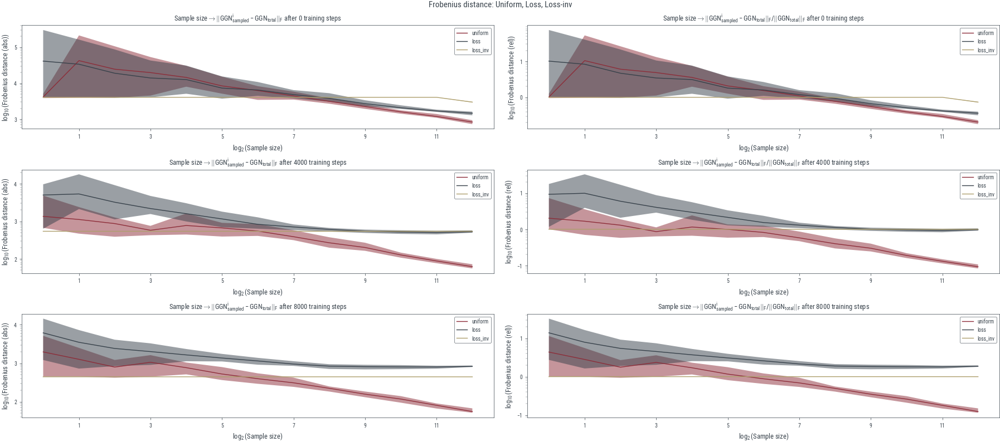

In [53]:
sampling_methods = ["uniform", "loss", "loss_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance: Uniform, Loss, Loss-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_{10}{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F / \|\\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_{10}{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Uniform, Loss-class, Loss-class-inv

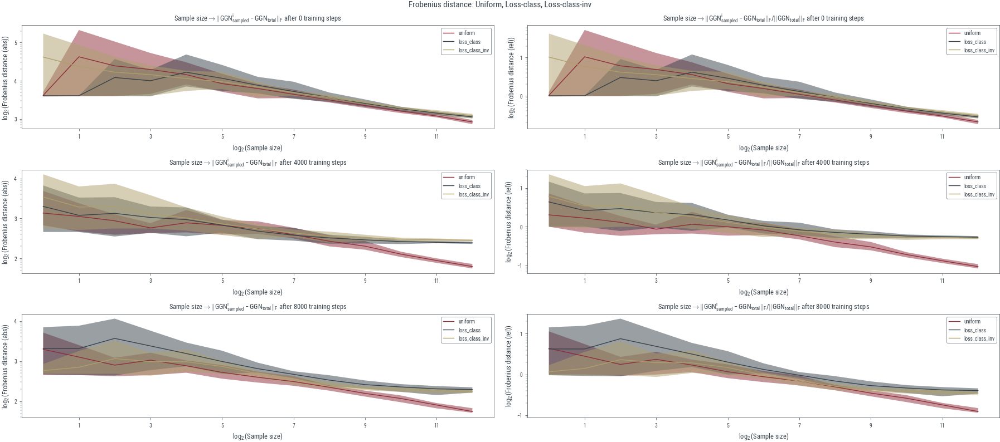

In [54]:
sampling_methods = ["uniform", "loss_class", "loss_class_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance: Uniform, Loss-class, Loss-class-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_2{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F / \|\\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_2{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Uniform, Loss-classeq, Loss-classeq-inv

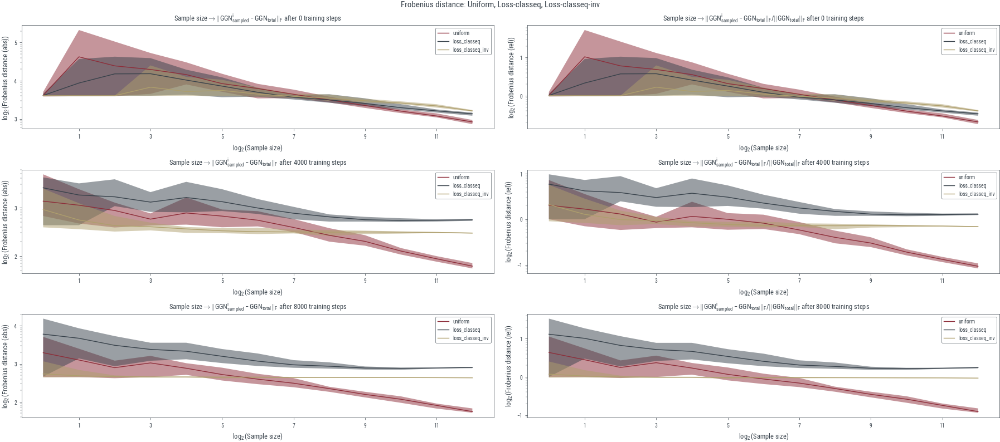

In [55]:
sampling_methods = ["uniform", "loss_classeq", "loss_classeq_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance: Uniform, Loss-classeq, Loss-classeq-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_2{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|\\text{GGN}^{i}_{\\text{sampled}} - \\text{GGN}_{\\text{total}}\|_F / \|\\text{GGN}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_2{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Observations:

- Relative F-distance only const-scaled version of absolute F-distance (due to const denominator)
- Uniform outperforms all other sampling methods for larger sample sizes
- Inverse sampling methods remain nearly constant (effect increased for later training stages)
- Non-inverse sampling methods converge to inverse sampling methods for large sample sizes (effect increased for later training stages)
  
### Discussion:

- Frobenius norm is equivalent to L2 norm of eigenvalues for PSD matrix
- But difference of two PSD matrices allows no conclusions about the eigenvalues of the difference matrix
- Loss-Hessian for extreme low-loss datapoints contains mostly zeros, apart from the value corresponding to the correct class, leading to a near-zero GGN (cf. relative F-distance = 1)

## 2: Frobenius distance of GGN-inverse:

In [56]:
results_path = "../results_v9/inv_frobenius/"
min_exp = 0
max_exp = 12
ggn_iteration_freq = 4000
num_ggn_iterations = 3

sampling_methods = ["uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
iterations = [ggn_iteration_freq * x for x in range(0, num_ggn_iterations)]
batch_sizes = [2**x for x in range(min_exp, max_exp+1)]

frobenius_distances = {}
frobenius_distances_rel = {}

for sampling_method in sampling_methods:
    frobenius_distances[sampling_method] = []
    frobenius_distances_rel[sampling_method] = []
    for iters in iterations:
        frobenius_distances[sampling_method].append([])
        frobenius_distances_rel[sampling_method].append([])
        for batch_size in batch_sizes:
            frobenius_distances[sampling_method][-1].append(np.load(str(Path(results_path, sampling_method, f"inv_f_norm_{batch_size}_batched_{iters}.npy"))).flatten())
            frobenius_distances_rel[sampling_method][-1].append(np.load(str(Path(results_path, sampling_method, f"inv_f_norm_rel_{batch_size}_batched_{iters}.npy"))).flatten())
        frobenius_distances[sampling_method][-1] = np.stack(frobenius_distances[sampling_method][-1])
        frobenius_distances_rel[sampling_method][-1] = np.stack(frobenius_distances_rel[sampling_method][-1])

### Uniform, Loss, Loss-inv

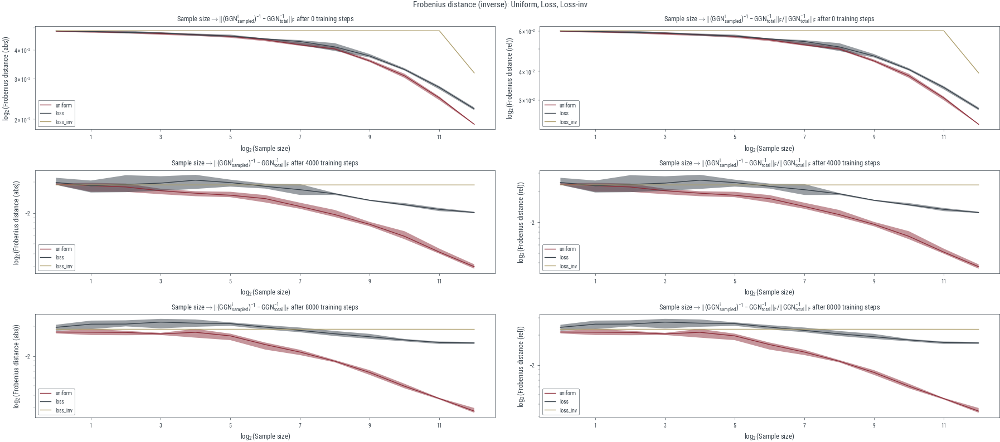

In [57]:
sampling_methods = ["uniform", "loss", "loss_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance (inverse): Uniform, Loss, Loss-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_2{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F / \|\\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_2{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Uniform, Loss-class, Loss-class-inv

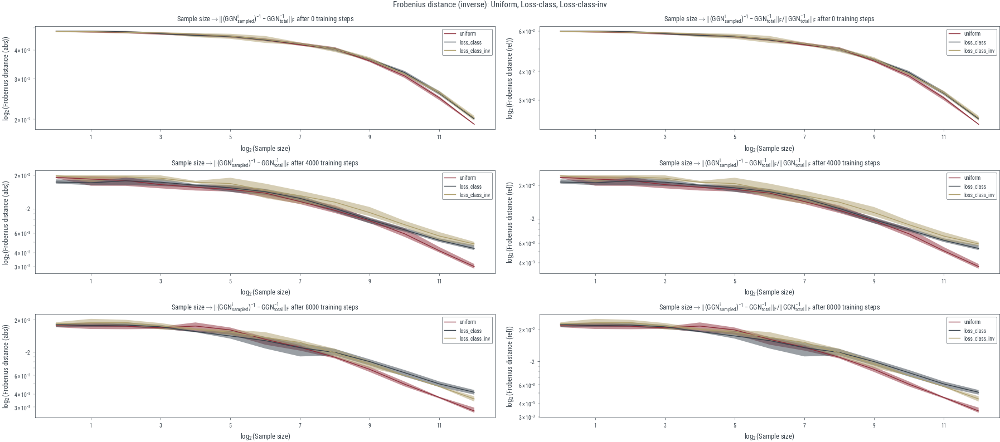

In [58]:
sampling_methods = ["uniform", "loss_class", "loss_class_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance (inverse): Uniform, Loss-class, Loss-class-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_2{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F / \|\\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_2{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Uniform, Loss-classeq, Loss-classeq-inv 

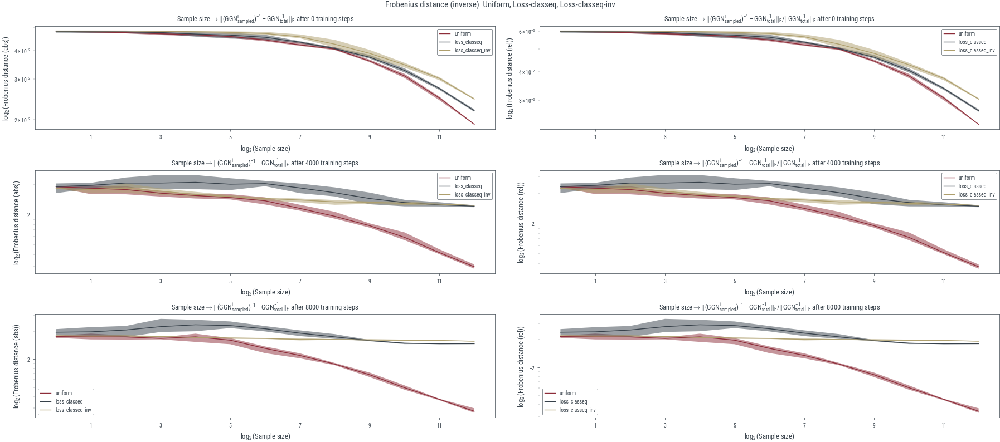

In [59]:
sampling_methods = ["uniform", "loss_classeq", "loss_classeq_inv"]

fig, axs = plt.subplots(num_ggn_iterations, 2, figsize=(18, 8))
fig.suptitle("Frobenius distance (inverse): Uniform, Loss-classeq, Loss-classeq-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods:
        axs[iters_idx, 0].plot(batch_sizes, frobenius_distances[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 0].fill_between(batch_sizes, np.min(frobenius_distances[sampling_method][iters_idx], axis=1), np.max(frobenius_distances[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 0].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 0].set_xscale('log', base=2)
    axs[iters_idx, 0].set_yscale('log')
    axs[iters_idx, 0].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 0].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 0].set_ylabel("$\\log_2{(\\text{Frobenius distance (abs)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 0].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 0].legend()
    
    for sampling_method in sampling_methods:
        axs[iters_idx, 1].plot(batch_sizes, frobenius_distances_rel[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx, 1].fill_between(batch_sizes, np.min(frobenius_distances_rel[sampling_method][iters_idx], axis=1), np.max(frobenius_distances_rel[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx, 1].set_title("$\\text{Sample size} \\to \|(\\text{GGN}^{i}_{\\text{sampled}})^{-1} - \\text{GGN}^{-1}_{\\text{total}}\|_F / \|\\text{GGN}^{-1}_{\\text{total}}\|_F$ after " + str(iters) + " training steps")
    axs[iters_idx, 1].set_xscale('log', base=2)
    axs[iters_idx, 1].set_yscale('log')
    axs[iters_idx, 1].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx, 1].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx, 1].set_ylabel("$\\log_2{(\\text{Frobenius distance (rel)})}$")
    ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
    axs[iters_idx, 1].yaxis.set_major_formatter(ylogfmt)
    axs[iters_idx, 1].legend();

### Observations:

- Observations from 1 can mostly be transferred 
- Classwise sampling next best to uniform sampling
  
### Discussion:

- Frobenius norm is equivalent to L2 norm of eigenvalues for PSD matrix
- But difference of two PSD matrices allows no conclusions about the eigenvalues of the difference matrix

## 3: Eigenspace overlap of GGN:

In [60]:
results_path = "../results_v9/eigen/"
min_exp = 0
max_exp = 12
n_samples = 8
ggn_iteration_freq = 4000
num_ggn_iterations = 3

sampling_methods = ["uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
iterations = [ggn_iteration_freq * x for x in range(0, num_ggn_iterations)]
batch_sizes = [2**x for x in range(min_exp, max_exp+1)]

eig_overlap = {}

for sampling_method in sampling_methods:
    eig_overlap[sampling_method] = []
    for iters in iterations:
        eig_overlap[sampling_method].append([])
        for sample_size in batch_sizes:
            eig_overlap[sampling_method][-1].append(np.load(str(Path(results_path, sampling_method, f"eig_overlap_{sample_size}_batched_{iters}.npy"))).flatten())
        eig_overlap[sampling_method][-1] = np.nan_to_num(np.stack(eig_overlap[sampling_method][-1]))

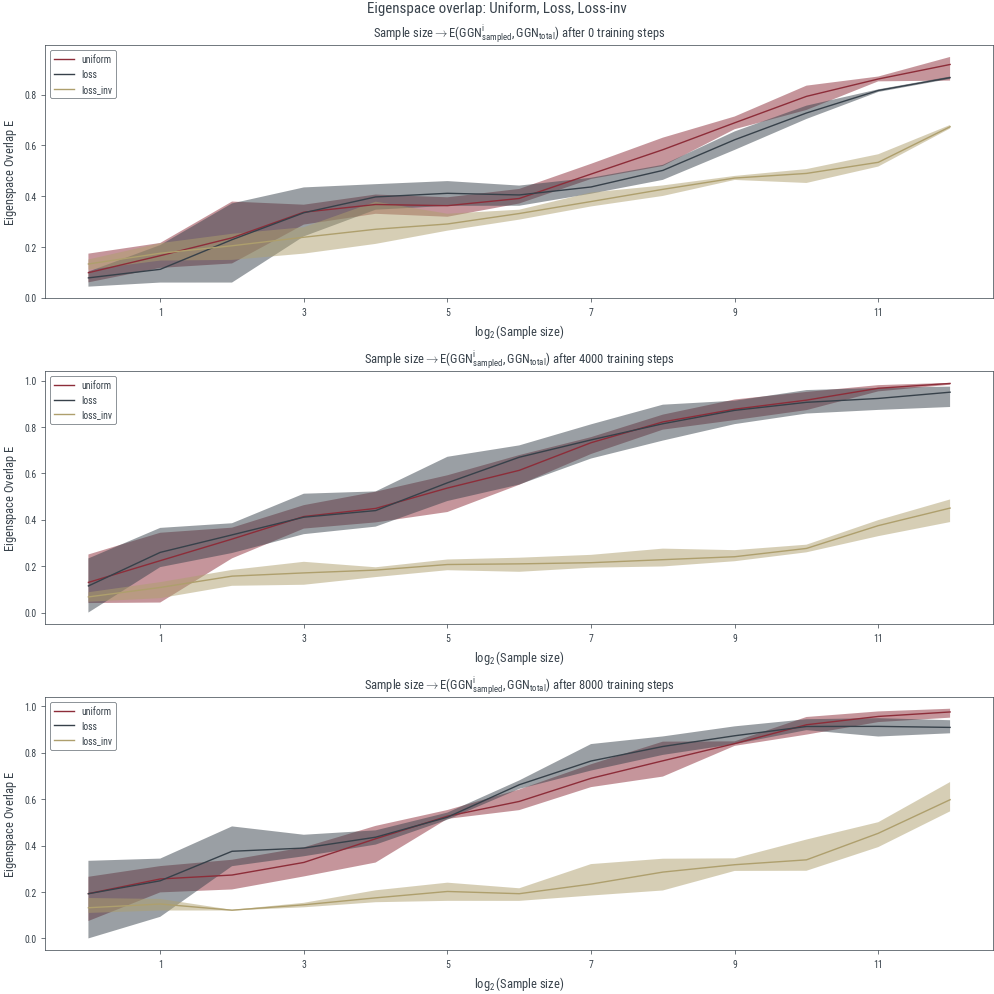

In [62]:
sampling_methods_plot = ["uniform", "loss", "loss_inv"]
fig, axs = plt.subplots(num_ggn_iterations, figsize=(10, 10))
fig.suptitle("Eigenspace overlap: Uniform, Loss, Loss-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods_plot:
        axs[iters_idx].plot(batch_sizes, eig_overlap[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx].fill_between(batch_sizes, np.min(eig_overlap[sampling_method][iters_idx], axis=1), np.max(eig_overlap[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx].set_title("$\\text{Sample size} \\to E(\\text{GGN}^{i}_{\\text{sampled}}, \\text{GGN}_{\\text{total}})$ after " + str(iters) + " training steps")
    axs[iters_idx].set_xscale('log', base=2)
    axs[iters_idx].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx].set_ylabel("$\\text{Eigenspace Overlap E}$")
    axs[iters_idx].legend();

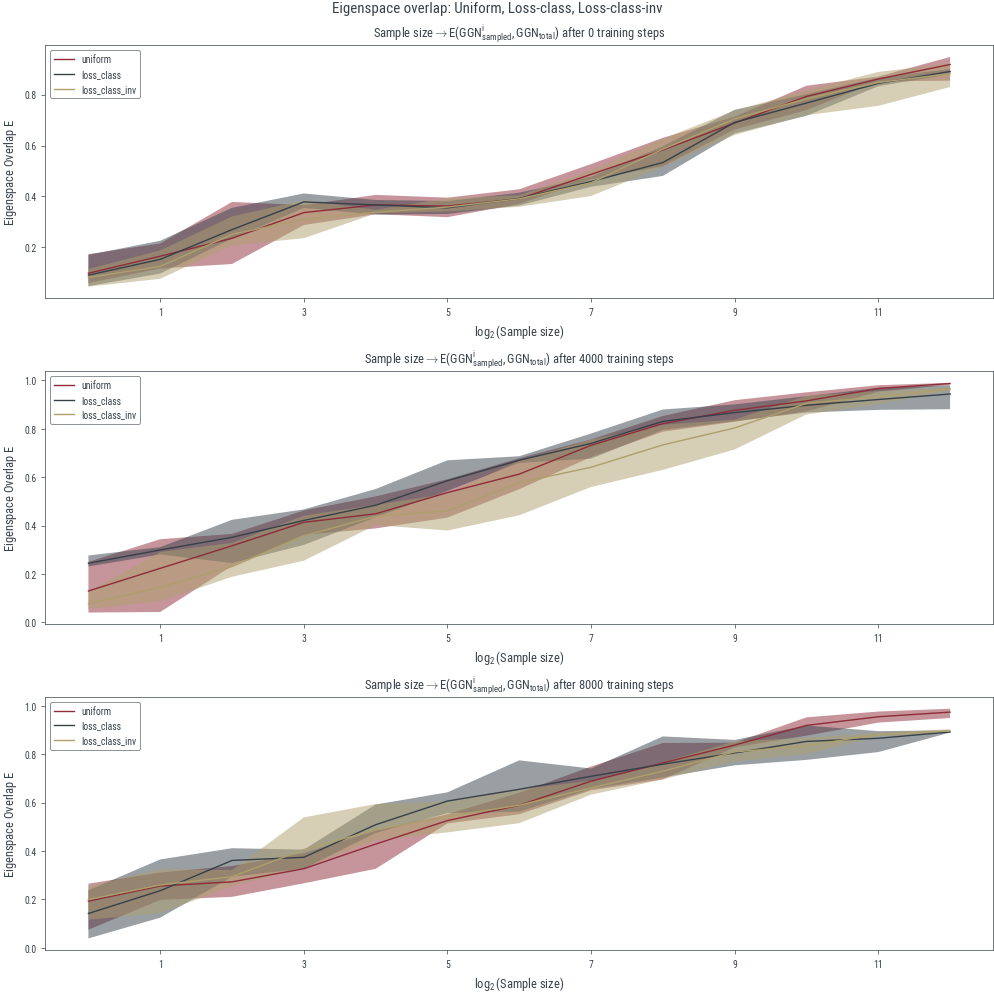

In [63]:
sampling_methods_plot = ["uniform", "loss_class", "loss_class_inv"]
fig, axs = plt.subplots(num_ggn_iterations, figsize=(10, 10))
fig.suptitle("Eigenspace overlap: Uniform, Loss-class, Loss-class-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods_plot:
        axs[iters_idx].plot(batch_sizes, eig_overlap[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx].fill_between(batch_sizes, np.min(eig_overlap[sampling_method][iters_idx], axis=1), np.max(eig_overlap[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx].set_title("$\\text{Sample size} \\to E(\\text{GGN}^{i}_{\\text{sampled}}, \\text{GGN}_{\\text{total}})$ after " + str(iters) + " training steps")
    axs[iters_idx].set_xscale('log', base=2)
    axs[iters_idx].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx].set_ylabel("$\\text{Eigenspace Overlap E}$")
    axs[iters_idx].legend();

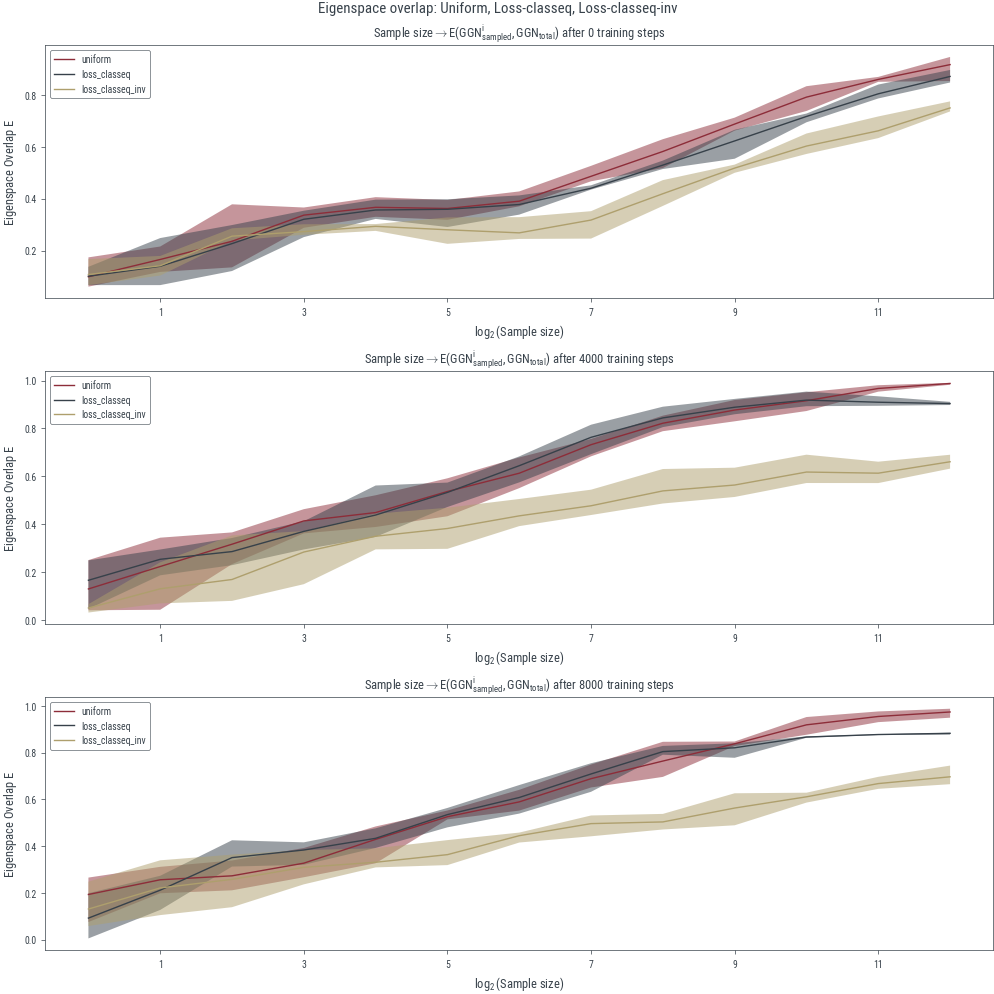

In [64]:
sampling_methods_plot = ["uniform", "loss_classeq", "loss_classeq_inv"]
fig, axs = plt.subplots(num_ggn_iterations, figsize=(10, 10))
fig.suptitle("Eigenspace overlap: Uniform, Loss-classeq, Loss-classeq-inv")

for iters_idx, iters in enumerate(iterations):
    for sampling_method in sampling_methods_plot:
        axs[iters_idx].plot(batch_sizes, eig_overlap[sampling_method][iters_idx].mean(axis=1), label=sampling_method)
        axs[iters_idx].fill_between(batch_sizes, np.min(eig_overlap[sampling_method][iters_idx], axis=1), np.max(eig_overlap[sampling_method][iters_idx], axis=1), alpha=0.5)
    axs[iters_idx].set_title("$\\text{Sample size} \\to E(\\text{GGN}^{i}_{\\text{sampled}}, \\text{GGN}_{\\text{total}})$ after " + str(iters) + " training steps")
    axs[iters_idx].set_xscale('log', base=2)
    axs[iters_idx].set_xlabel("$\\log_2{(\\text{Sample size})}$")
    xlogfmt = LogFormatterExponent(base=2, labelOnlyBase=True)
    axs[iters_idx].xaxis.set_major_formatter(xlogfmt)
    axs[iters_idx].set_ylabel("$\\text{Eigenspace Overlap E}$")
    axs[iters_idx].legend();

### Observations:

- Non-inv loss-based sampling methods (also -class, -classeq) tend to outperform uniform sampling slightly for medium sample sizes
- Loss-inv, loss-classeq-inv worse
- Only uniform sampling reaches near 1.0 overlap for max sample size
  
### Discussion:

- Extreme low-loss datapoints seem to have different curvature than medium/high-loss datapoints
- Caused by near zero GGN (cf. 1), leading to near zero eigenvalues and only little curvature
- There are more medium/high-loss datapoints than extreme low-loss datapoints, this is why non-inv loss-based sampling and uniform sampling lead to similar results

## 4: Eigenspectra of GGN:

In [65]:
results_path = "../results_v9/eigen/"
min_exp = 0
max_exp = 12
n_samples = 4
ggn_iteration_freq = 4000
num_ggn_iterations = 3

sampling_methods = ["total", "uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
iterations = [ggn_iteration_freq * x for x in range(0, num_ggn_iterations)]
batch_sizes = [2**x for x in range(min_exp, max_exp+1)]

eig_vals = {}

for sampling_method in sampling_methods:
    eig_vals[sampling_method] = []
    for iters in iterations:
        eig_vals[sampling_method].append([])
        if sampling_method == "total":
            eig_vals[sampling_method][-1].append(np.flip(np.load(str(Path(results_path, f"eigvals_total_{iters}.npy")))[0], axis=-1))
        else:
            for sample_size in batch_sizes:
                eig_vals[sampling_method][-1].append(np.flip(np.load(str(Path(results_path, sampling_method, f"eigvals_{sample_size}_batched_{iters}.npy")))[0], axis=-1))
        eig_vals[sampling_method][-1] = np.nan_to_num(np.stack(eig_vals[sampling_method][-1]))

### Uniform, Loss, Loss-inv

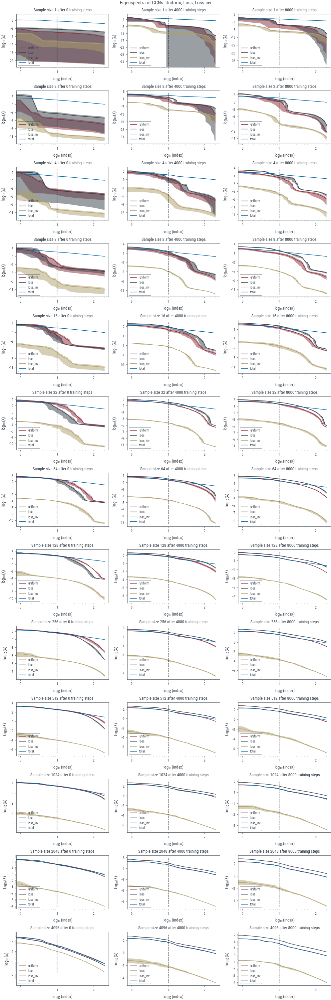

In [67]:
C = 10
L = 200

sampling_methods_plot = ["uniform", "loss", "loss_inv", "total"]
fig, axs = plt.subplots(len(batch_sizes), num_ggn_iterations, figsize=(10, 30))
fig.suptitle("Eigenspectra of GGNs: Uniform, Loss, Loss-inv")

for samples_idx, sample_size in enumerate(batch_sizes):
    for iters_idx, iters in enumerate(iterations):
        min_eigval_overall = np.inf
        max_eigval_overall = -np.inf
        for sample_method in sampling_methods_plot:
            y = np.broadcast_to(eig_vals[sample_method][iters_idx], (len(batch_sizes), n_samples, eig_vals[sample_method][iters_idx].shape[-1]))
            
            mean_eigval = np.mean(y[samples_idx], axis=0)[:L]
            min_eigval = np.min(y[samples_idx], axis=0)[:L]
            max_eigval = np.max(y[samples_idx], axis=0)[:L]
            
            min_eigval_overall = min(min_eigval_overall, min_eigval[-1])
            max_eigval_overall = max(max_eigval_overall, max_eigval[0])
            
            axs[samples_idx, iters_idx].plot(np.arange(L), mean_eigval, label=sample_method)
            axs[samples_idx, iters_idx].fill_between(np.arange(L), min_eigval, max_eigval, alpha=0.5)
            axs[samples_idx, iters_idx].set_title(f"Sample size {sample_size} after {iters} training steps")
            axs[samples_idx, iters_idx].set_xscale("log")
            xlogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].xaxis.set_major_formatter(xlogfmt)
            axs[samples_idx, iters_idx].set_xlabel("$\\log_{10}{(\\text{index})}$")
            axs[samples_idx, iters_idx].set_yscale("log")
            ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].yaxis.set_major_formatter(ylogfmt)
            axs[samples_idx, iters_idx].set_ylabel("$\\log_{10}{(\\lambda)}$")
            axs[samples_idx, iters_idx].legend(loc="lower left");
        
        axs[samples_idx, iters_idx].vlines(C, min_eigval_overall, max_eigval_overall, linestyles="dashed", colors=["black"], alpha=0.66)

### Uniform, Loss-class, Loss-class-inv

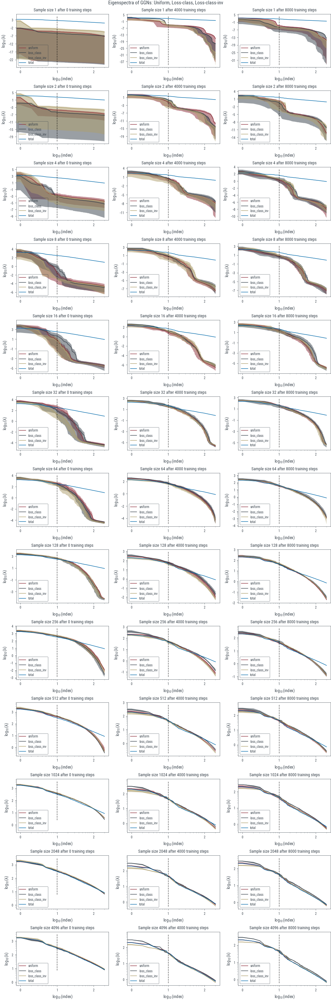

In [68]:
C = 10
L = 200

sampling_methods_plot = ["uniform", "loss_class", "loss_class_inv", "total"]
fig, axs = plt.subplots(len(batch_sizes), num_ggn_iterations, figsize=(10, 30))
fig.suptitle("Eigenspectra of GGNs: Uniform, Loss-class, Loss-class-inv")

for samples_idx, sample_size in enumerate(batch_sizes):
    for iters_idx, iters in enumerate(iterations):
        min_eigval_overall = np.inf
        max_eigval_overall = -np.inf
        for sample_method in sampling_methods_plot:
            y = np.broadcast_to(eig_vals[sample_method][iters_idx], (len(batch_sizes), n_samples, eig_vals[sample_method][iters_idx].shape[-1]))
            
            mean_eigval = np.mean(y[samples_idx], axis=0)[:L]
            min_eigval = np.min(y[samples_idx], axis=0)[:L]
            max_eigval = np.max(y[samples_idx], axis=0)[:L]
            
            min_eigval_overall = min(min_eigval_overall, min_eigval[-1])
            max_eigval_overall = max(max_eigval_overall, max_eigval[0])
            
            axs[samples_idx, iters_idx].plot(np.arange(L), mean_eigval, label=sample_method)
            axs[samples_idx, iters_idx].fill_between(np.arange(L), min_eigval, max_eigval, alpha=0.5)
            axs[samples_idx, iters_idx].set_title(f"Sample size {sample_size} after {iters} training steps")
            axs[samples_idx, iters_idx].set_xscale("log")
            xlogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].xaxis.set_major_formatter(xlogfmt)
            axs[samples_idx, iters_idx].set_xlabel("$\\log_{10}{(\\text{index})}$")
            axs[samples_idx, iters_idx].set_yscale("log")
            ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].yaxis.set_major_formatter(ylogfmt)
            axs[samples_idx, iters_idx].set_ylabel("$\\log_{10}{(\\lambda)}$")
            axs[samples_idx, iters_idx].legend(loc="lower left");
        
        axs[samples_idx, iters_idx].vlines(C, min_eigval_overall, max_eigval_overall, linestyles="dashed", colors=["black"], alpha=0.66)

### Uniform, Loss-classeq, Loss-classeq-inv

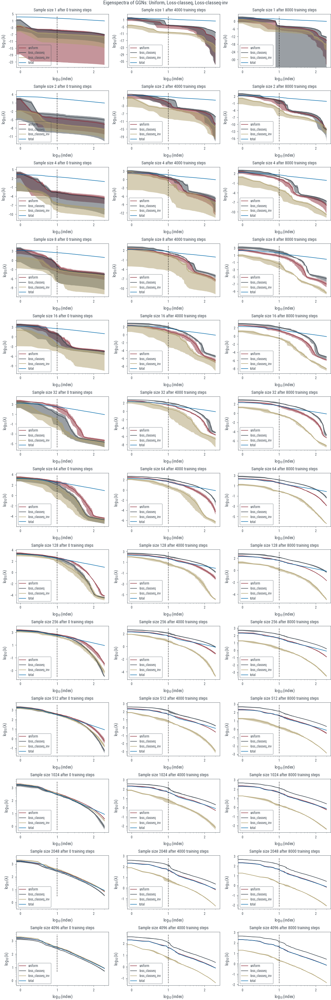

In [69]:
C = 10
L = 200

sampling_methods_plot = ["uniform", "loss_classeq", "loss_classeq_inv", "total"]
fig, axs = plt.subplots(len(batch_sizes), num_ggn_iterations, figsize=(10, 30))
fig.suptitle("Eigenspectra of GGNs: Uniform, Loss-classeq, Loss-classeq-inv")

for samples_idx, sample_size in enumerate(batch_sizes):
    for iters_idx, iters in enumerate(iterations):
        min_eigval_overall = np.inf
        max_eigval_overall = -np.inf
        for sample_method in sampling_methods_plot:
            y = np.broadcast_to(eig_vals[sample_method][iters_idx], (len(batch_sizes), n_samples, eig_vals[sample_method][iters_idx].shape[-1]))
            
            mean_eigval = np.mean(y[samples_idx], axis=0)[:L]
            min_eigval = np.min(y[samples_idx], axis=0)[:L]
            max_eigval = np.max(y[samples_idx], axis=0)[:L]
            
            min_eigval_overall = min(min_eigval_overall, min_eigval[-1])
            max_eigval_overall = max(max_eigval_overall, max_eigval[0])
            
            axs[samples_idx, iters_idx].plot(np.arange(L), mean_eigval, label=sample_method)
            axs[samples_idx, iters_idx].fill_between(np.arange(L), min_eigval, max_eigval, alpha=0.5)
            axs[samples_idx, iters_idx].set_title(f"Sample size {sample_size} after {iters} training steps")
            axs[samples_idx, iters_idx].set_xscale("log")
            xlogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].xaxis.set_major_formatter(xlogfmt)
            axs[samples_idx, iters_idx].set_xlabel("$\\log_{10}{(\\text{index})}$")
            axs[samples_idx, iters_idx].set_yscale("log")
            ylogfmt = LogFormatterExponent(base=10, labelOnlyBase=True)
            axs[samples_idx, iters_idx].yaxis.set_major_formatter(ylogfmt)
            axs[samples_idx, iters_idx].set_ylabel("$\\log_{10}{(\\lambda)}$")
            axs[samples_idx, iters_idx].legend(loc="lower left");
        
        axs[samples_idx, iters_idx].vlines(C, min_eigval_overall, max_eigval_overall, linestyles="dashed", colors=["black"], alpha=0.66)

### Observations:

- Loss, loss-classeq overestimate curvature
- Loss-inv, loss-classeq-inv underestimate curvature
- Loss-class and loss-class-inv similar to uniform
  
### Discussion:

- Confirmation of discussion in 4

## 5: Laplace approximation:

In [5]:
results_path = "../results_v9/laplace/"
min_exp = 0
max_exp = 12
n_samples = 4
n_steps = 9375

sampling_methods = ["total", "uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
iterations = [ggn_iteration_freq * x for x in range(0, num_ggn_iterations)]
batch_sizes = [2**x for x in range(min_exp, max_exp+1)]

ltk_results = {}
pred_distr_results = {}

for sampling_method in sampling_methods:
    ltk_results[sampling_method] = []
    pred_distr_results[sampling_method] = []
    if sampling_method == "total":
        ltk_results[sampling_method].append(np.load(str(Path(results_path, f"LTK_total_{n_steps}.npy"))))
        pred_distr_results[sampling_method].append(np.load(str(Path(results_path, f"pred_distr_total_{n_steps}.npy"))))
    else:
        for batch_size in batch_sizes:
            ltk_results[sampling_method].append(np.load(str(Path(results_path, sampling_method, f"LTK_{batch_size}_batched_{n_steps}.npy"))))
            pred_distr_results[sampling_method].append(np.load(str(Path(results_path, sampling_method, f"pred_distr_{batch_size}_batched_{n_steps}.npy"))))
        ltk_results[sampling_method] = np.stack(ltk_results[sampling_method], axis=0)
        pred_distr_results[sampling_method] = np.stack(pred_distr_results[sampling_method], axis=0)

### Frobenius distances of LTK

In [17]:
f_distances = {}
f_range = []

for sampling_method in sampling_methods:
    if sampling_method == "total":
        continue
    
    f_distances[sampling_method] = np.linalg.norm(np.broadcast_to(ltk_results["total"][0][None, None, ...], ltk_results[sampling_method].shape) - ltk_results[sampling_method], ord="fro", axis=(-1, -2))
    f_distances[sampling_method] = f_distances[sampling_method] / np.linalg.norm(np.broadcast_to(ltk_results["total"][0][None, None, ...], ltk_results[sampling_method].shape), ord="fro", axis=(-1, -2))
    f_range.append(np.stack([np.amin(f_distances[sampling_method], axis=(-1, -2)), np.amax(f_distances[sampling_method], axis=(-1, -2))], axis=1))
    
f_range = np.stack(f_range, axis=1)
f_range = np.stack([np.amin(f_range[:, :, 0], axis=1), np.amax(f_range[:, :, 1], axis=1)], axis=1)
f_range[:, 1] = 4.

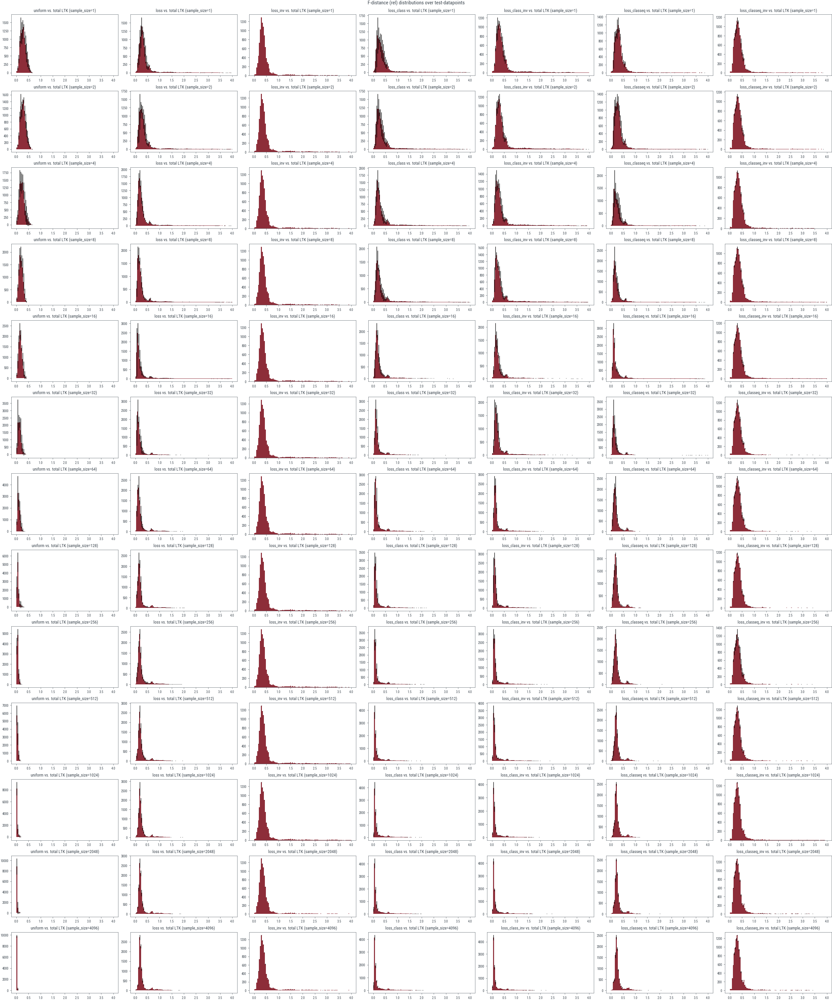

In [19]:
n_bins = 100
sampling_methods_plot = ["uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
fig, axs = plt.subplots(len(batch_sizes), len(sampling_methods_plot), figsize=(25, 30))

for samples_idx, sample_size in enumerate(batch_sizes):
    for method_idx, sampling_method in enumerate(sampling_methods_plot):
        _, edges = np.histogram(f_distances[sampling_method][samples_idx, 0], bins=n_bins, range=(f_range[samples_idx, 0],f_range[samples_idx, 1]))
        ys = np.stack([np.histogram(f_distances[sampling_method][samples_idx, sample_idx], bins=n_bins, range=(f_range[samples_idx, 0],f_range[samples_idx, 1]))[0] for sample_idx in range(n_samples)], axis=0)
        mid = 0.5 * (edges[1:] + edges[:-1])
        y_mean = np.mean(ys, axis=0)
        y_std = np.std(ys, axis=0, ddof=1)
        bar_width = (f_range[samples_idx, 1] - f_range[samples_idx, 0]) / n_bins
        axs[samples_idx, method_idx].bar(mid, y_mean, width=bar_width, yerr=y_std)
        axs[samples_idx, method_idx].set_title(f"{sampling_method} vs. total LTK (sample_size={sample_size})")

plt.suptitle("F-distance (rel) distributions over test-datapoints");

### Visual examples of LTK:

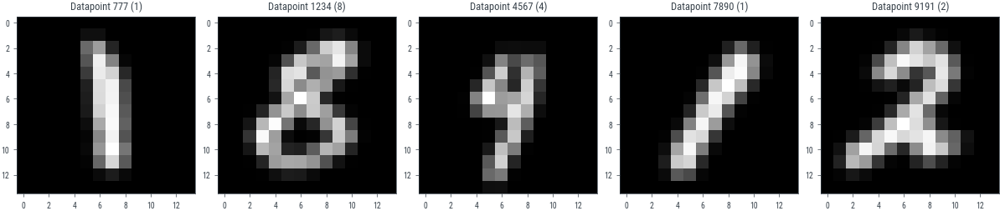

In [70]:
test_dataset = get_dataset("mnist", train=False, px=14, path="../data/")
data_indices = [777, 1234, 4567, 7890, 9191]
class_labels = []

fig, axs = plt.subplots(1, len(data_indices), figsize=(12, 3))

for idx, data_idx in enumerate(data_indices):
    img, label = test_dataset[data_idx]
    class_labels.append(label)
    axs[idx].imshow(img.reshape(14, 14), cmap="gray")
    axs[idx].set_title(f"Datapoint {data_idx} ({label})")

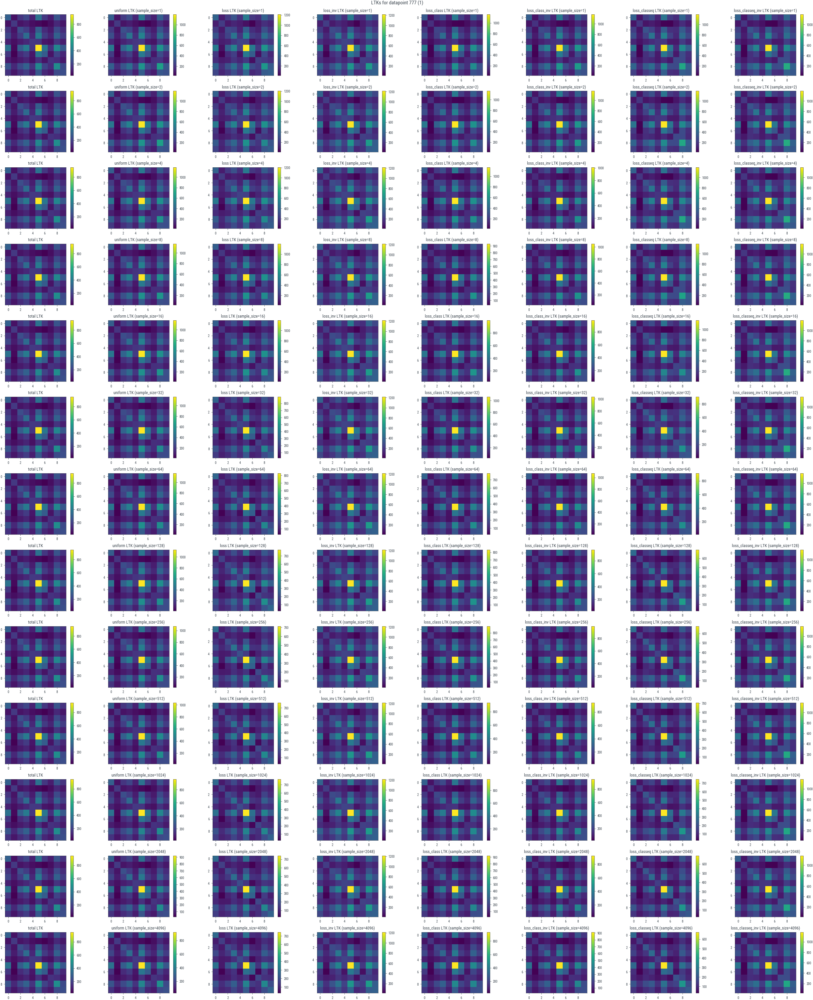

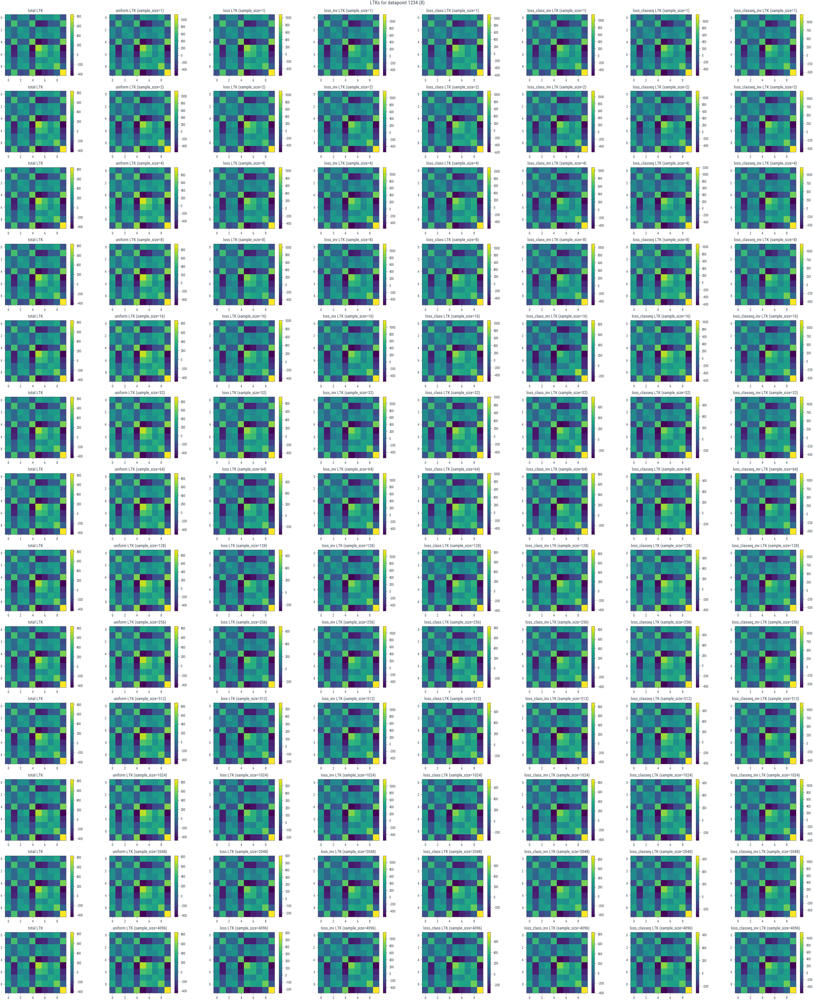

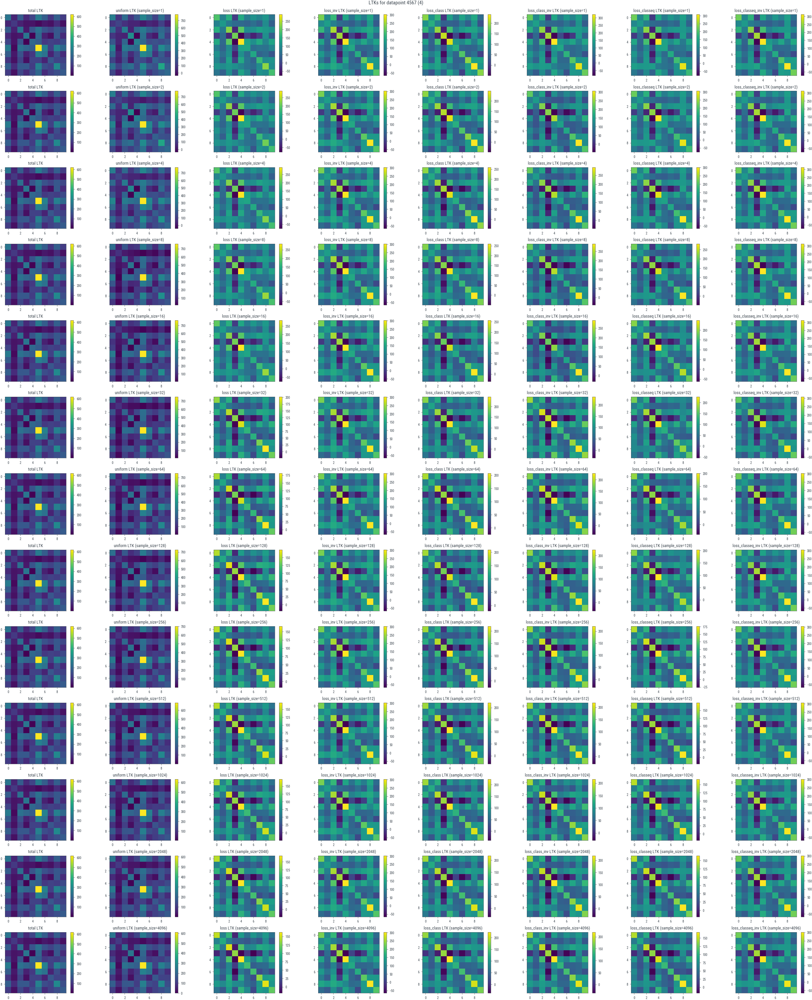

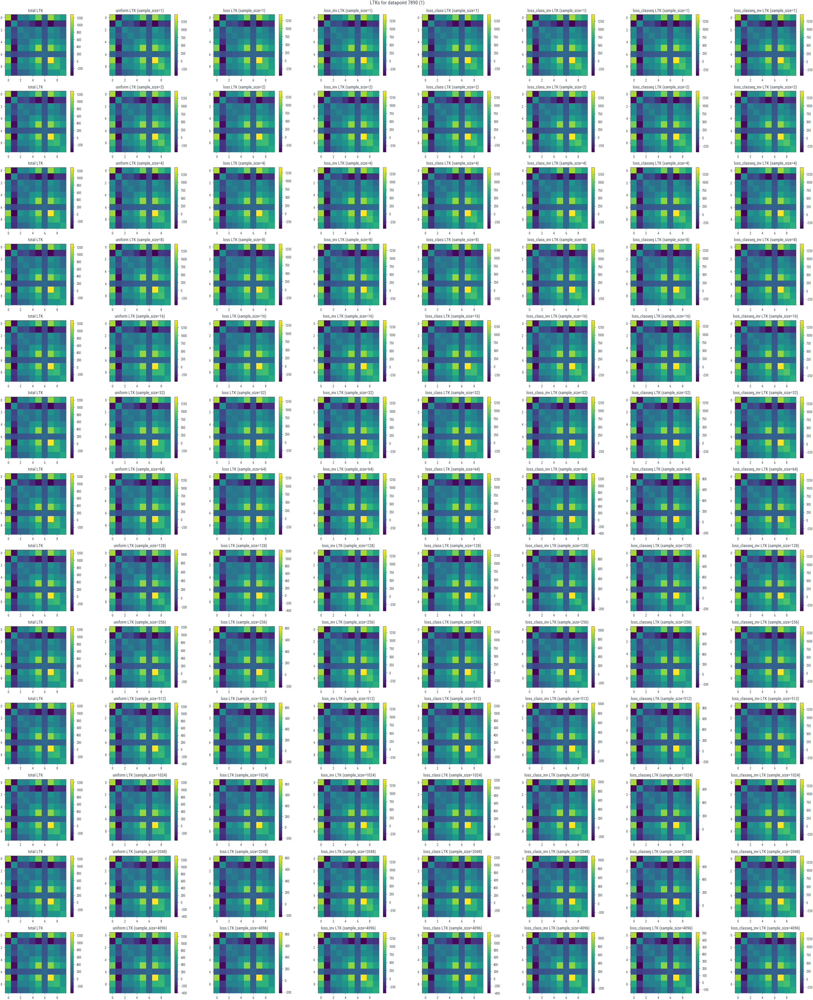

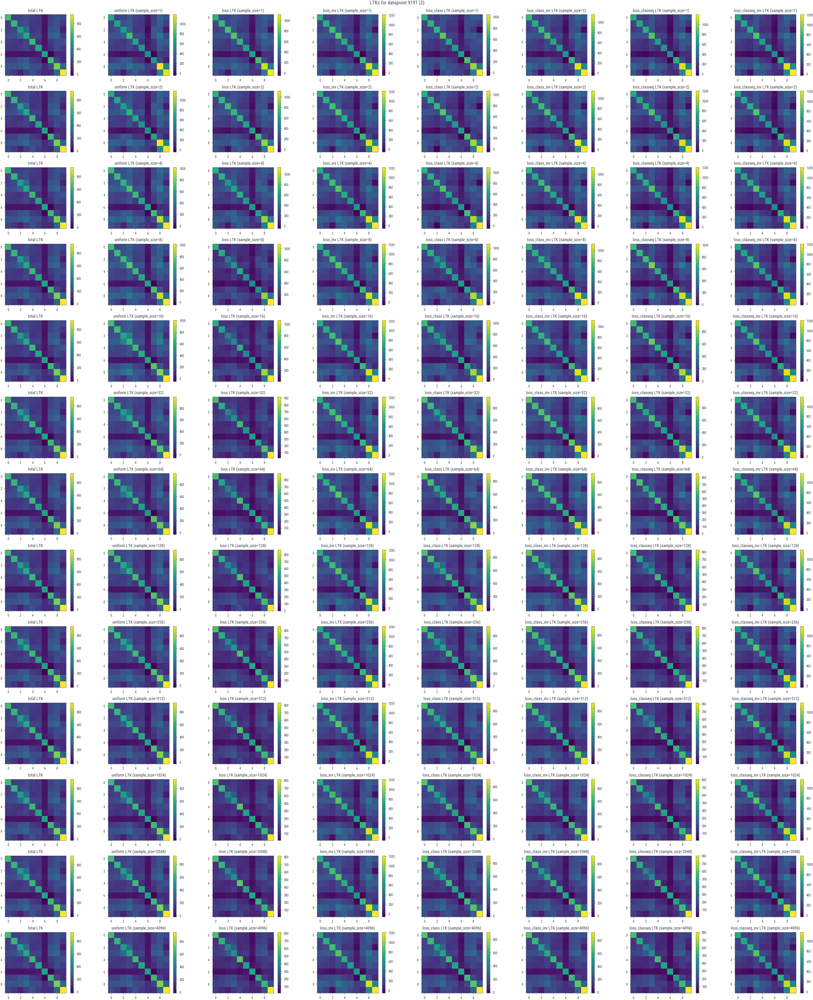

In [71]:
for data_idx, class_label in zip(data_indices, class_labels):
    fig, axs = plt.subplots(len(batch_sizes), len(sampling_methods), figsize=(25, 30))

    for samples_idx, sample_size in enumerate(batch_sizes):
        for method_idx, sampling_method in enumerate(sampling_methods):
            if sampling_method == "total":
                ltk = ltk_results[sampling_method][0][data_idx]
            else:
                ltk = ltk_results[sampling_method][samples_idx, 0, data_idx]
            
            # ltk = (ltk - np.amin(ltk)) / (np.amax(ltk) - np.amin(ltk))
            
            p = axs[samples_idx, method_idx].imshow(ltk)
            fig.colorbar(p)
            
            if sampling_method == "total":
                axs[samples_idx, method_idx].set_title(f"{sampling_method} LTK")
            else:
                axs[samples_idx, method_idx].set_title(f"{sampling_method} LTK (sample_size={sample_size})")
    
    plt.suptitle(f"LTKs for datapoint {data_idx} ({class_label})")
    plt.show();

### KL divergence of predictive distributions

In [22]:
kl_divergence = {}
kl_range = []

fn_kl_divergence = lambda f, g: np.sum(f * np.log(f / g), axis=-1)

for sampling_method in sampling_methods:
    if sampling_method == "total":
        continue
    
    kl_divergence[sampling_method] = fn_kl_divergence(np.broadcast_to(pred_distr_results["total"][0][None, None, ...], pred_distr_results[sampling_method].shape), pred_distr_results[sampling_method])
    kl_range.append(np.stack([np.amin(kl_divergence[sampling_method], axis=(-1, -2)), np.amax(kl_divergence[sampling_method], axis=(-1, -2))], axis=1))
    
kl_range = np.stack(kl_range, axis=1)
kl_range = np.stack([np.amin(kl_range[:, :, 0], axis=1), np.amax(kl_range[:, :, 1], axis=1)], axis=1)

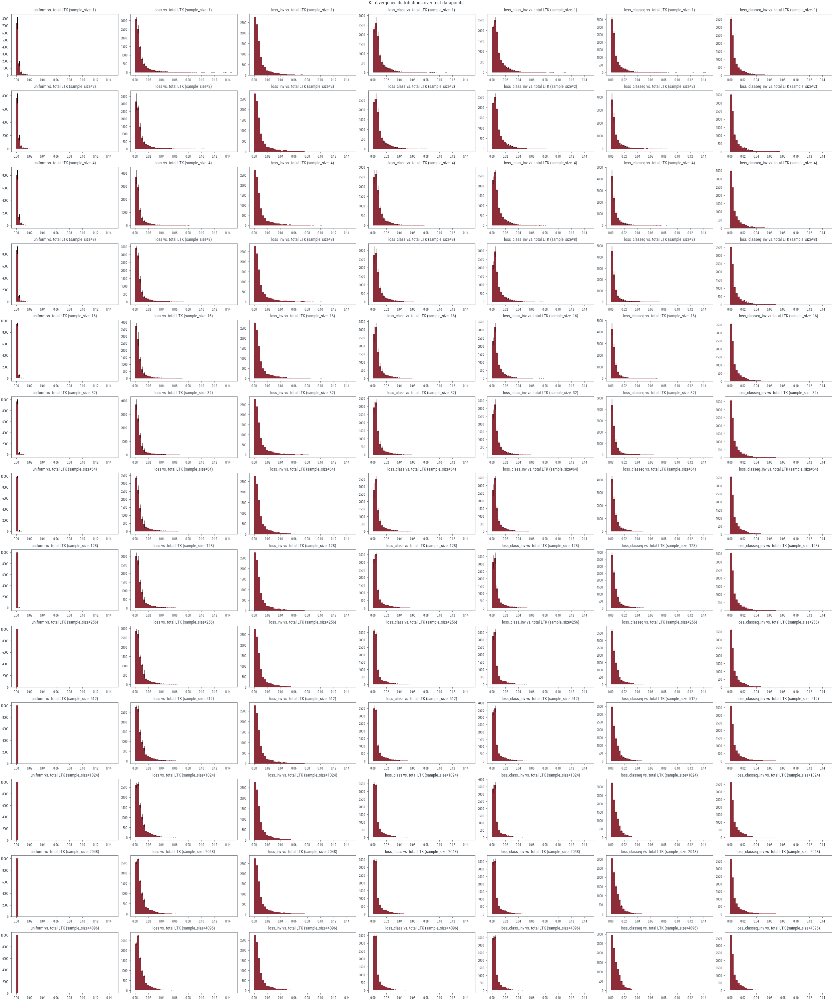

In [23]:
n_bins = 50
sampling_methods_plot = ["uniform", "loss", "loss_inv", "loss_class", "loss_class_inv", "loss_classeq", "loss_classeq_inv"]
fig, axs = plt.subplots(len(batch_sizes), len(sampling_methods_plot), figsize=(25, 30))

for samples_idx, sample_size in enumerate(batch_sizes):
    for method_idx, sampling_method in enumerate(sampling_methods_plot):
        _, edges = np.histogram(kl_divergence[sampling_method][samples_idx, 0], bins=n_bins, range=(kl_range[samples_idx, 0],kl_range[samples_idx, 1]))
        ys = np.stack([np.histogram(kl_divergence[sampling_method][samples_idx, sample_idx], bins=n_bins, range=(kl_range[samples_idx, 0],kl_range[samples_idx, 1]))[0] for sample_idx in range(n_samples)], axis=0)
        mid = 0.5 * (edges[1:] + edges[:-1])
        y_mean = np.mean(ys, axis=0)
        y_std = np.std(ys, axis=0, ddof=1)
        bar_width = (kl_range[samples_idx, 1] - kl_range[samples_idx, 0]) / n_bins
        axs[samples_idx, method_idx].bar(mid, y_mean, width=bar_width, yerr=y_std)
        axs[samples_idx, method_idx].set_title(f"{sampling_method} vs. total LTK (sample_size={sample_size})")

plt.suptitle("KL-divergence distributions over test-datapoints");

### Visual examples of predictive distribution

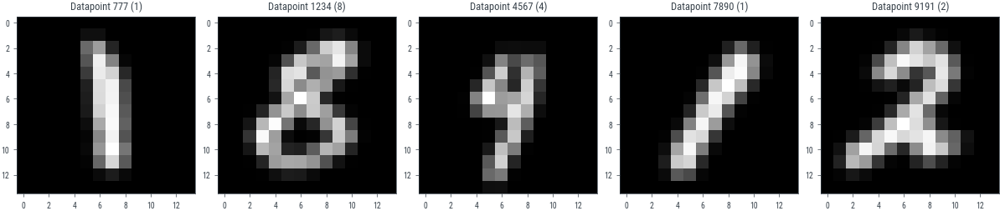

In [72]:
test_dataset = get_dataset("mnist", train=False, px=14, path="../data/")
data_indices = [777, 1234, 4567, 7890, 9191]
class_labels = []

fig, axs = plt.subplots(1, len(data_indices), figsize=(12, 3))

for idx, data_idx in enumerate(data_indices):
    img, label = test_dataset[data_idx]
    class_labels.append(label)
    axs[idx].imshow(img.reshape(14, 14), cmap="gray")
    axs[idx].set_title(f"Datapoint {data_idx} ({label})")

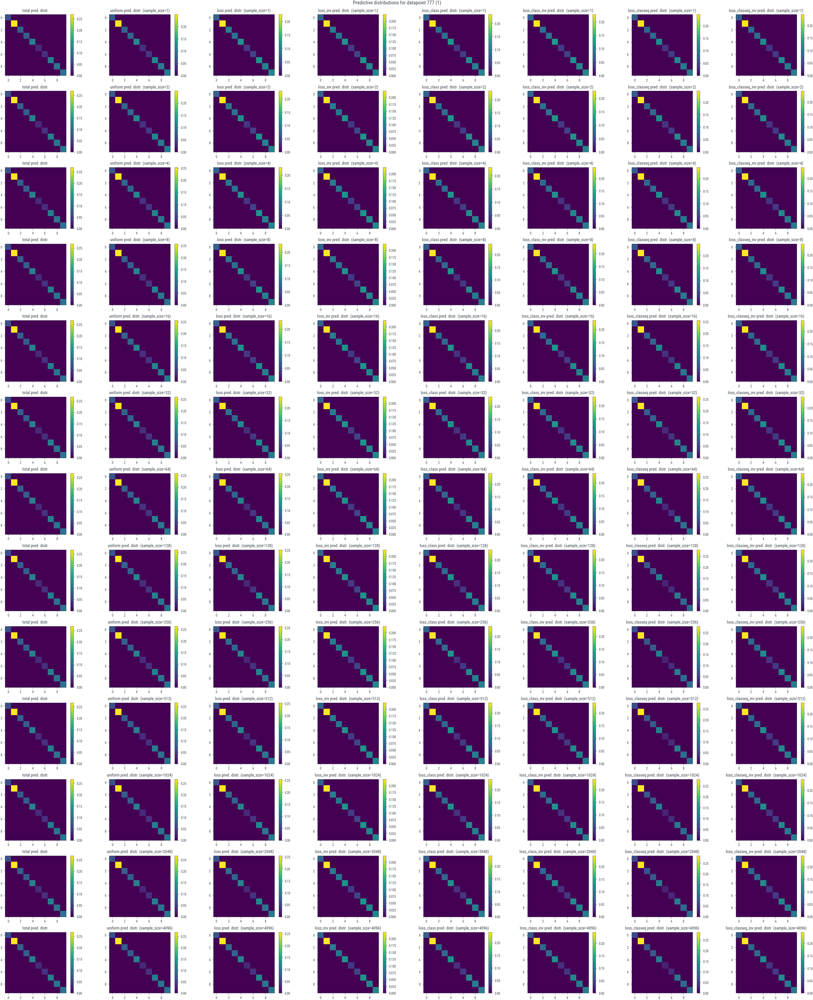

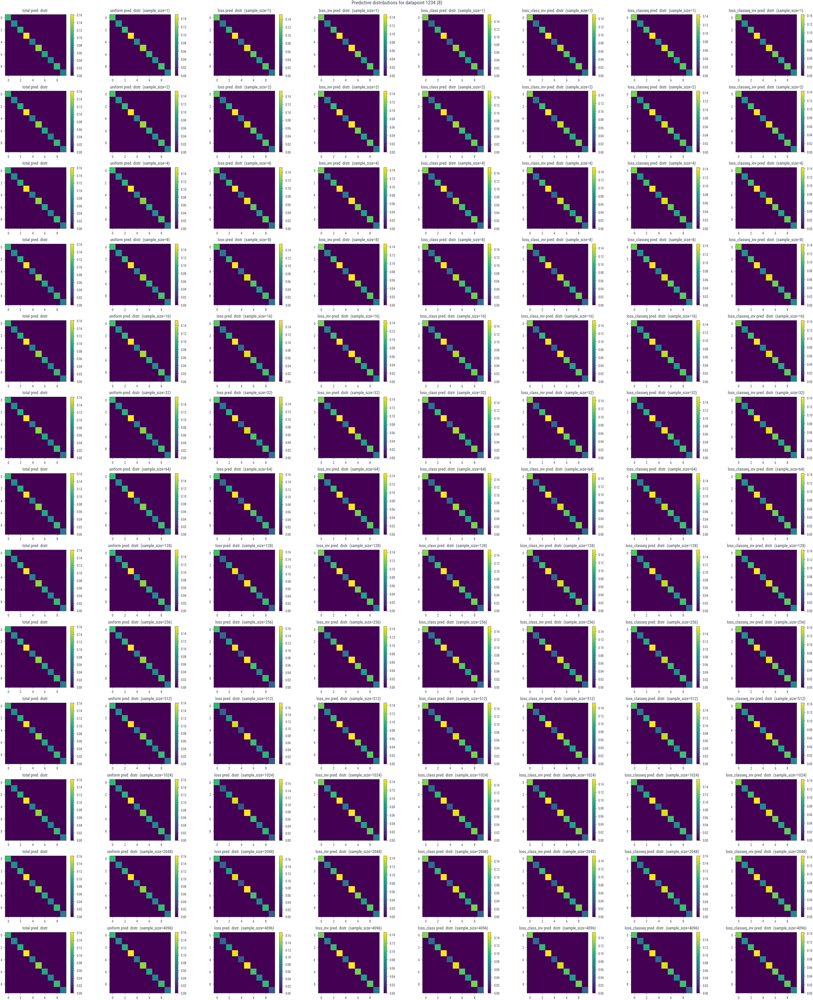

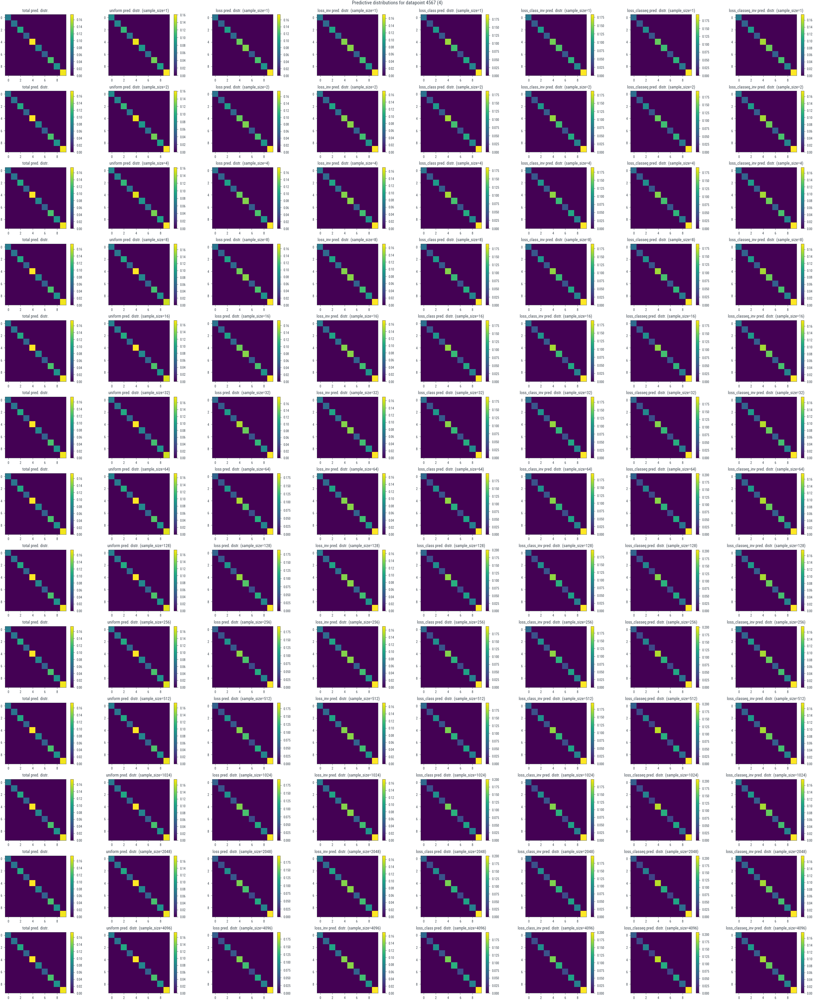

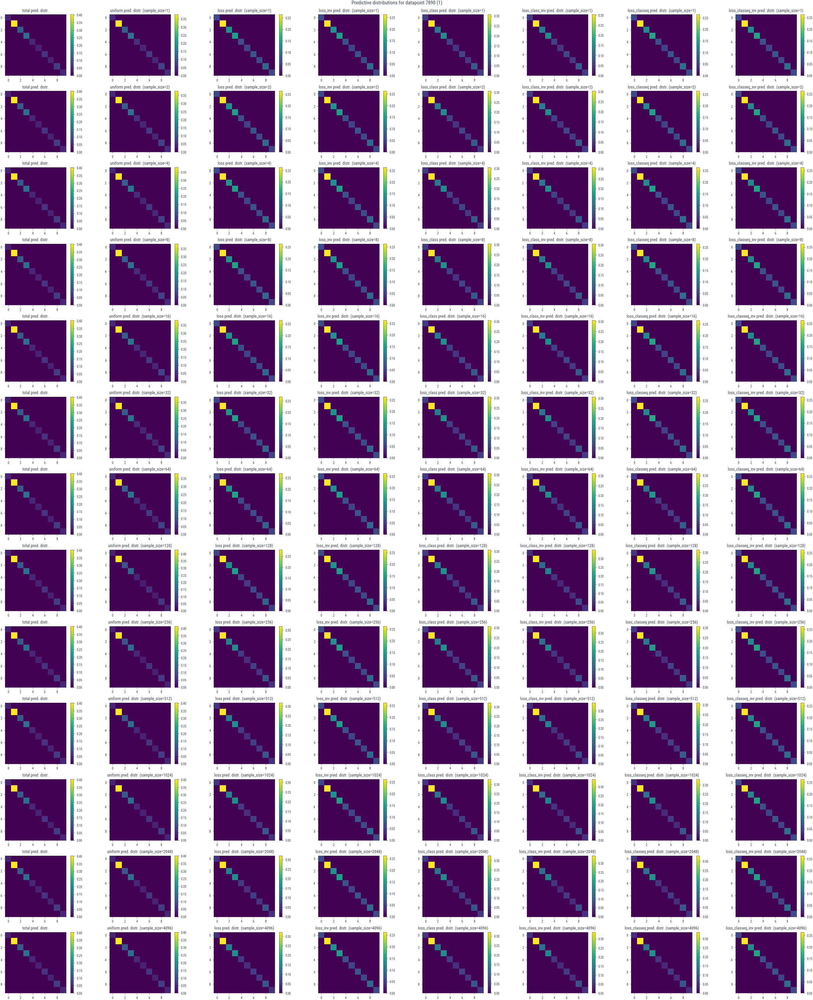

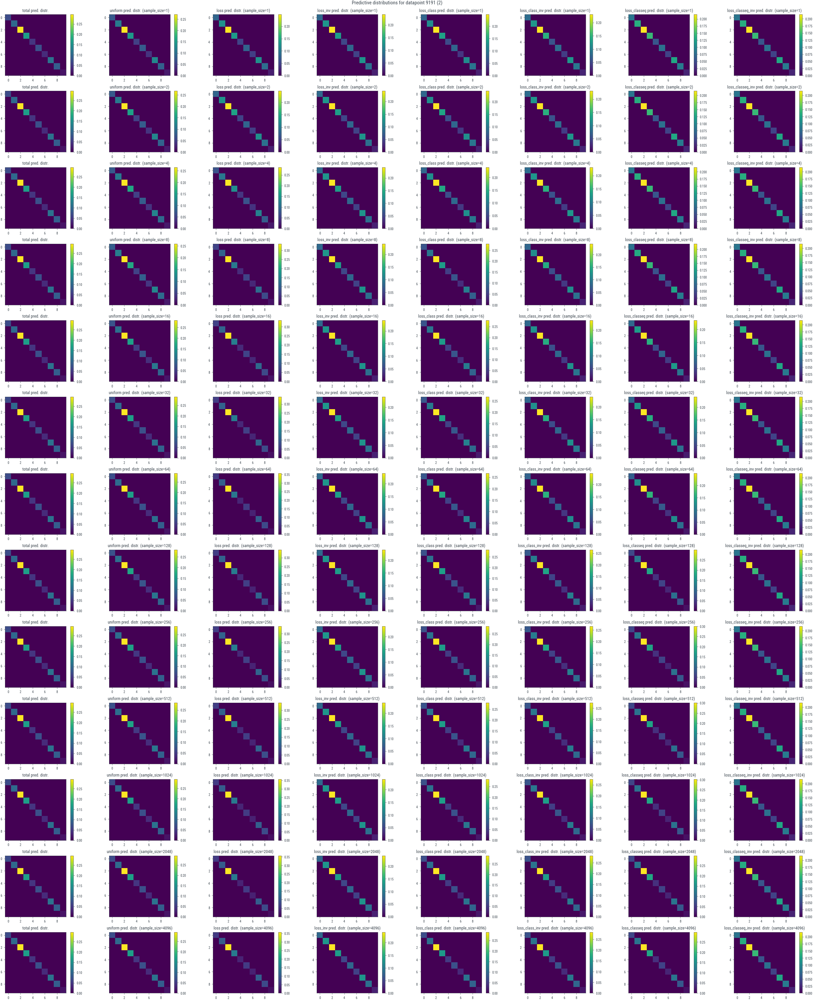

In [73]:
for data_idx, class_label in zip(data_indices, class_labels):
    fig, axs = plt.subplots(len(batch_sizes), len(sampling_methods), figsize=(25, 30))

    for samples_idx, sample_size in enumerate(batch_sizes):
        for method_idx, sampling_method in enumerate(sampling_methods):
            if sampling_method == "total":
                pred_distr = pred_distr_results[sampling_method][0][data_idx]
            else:
                pred_distr = pred_distr_results[sampling_method][samples_idx, 0, data_idx]
            
            p = axs[samples_idx, method_idx].imshow(np.diag(pred_distr))
            fig.colorbar(p)
            
            if sampling_method == "total":
                axs[samples_idx, method_idx].set_title(f"{sampling_method} pred. distr.")
            else:
                axs[samples_idx, method_idx].set_title(f"{sampling_method} pred. distr. (sample_size={sample_size})")
    
    plt.suptitle(f"Predictive distributions for datapoint {data_idx} ({class_label})")
    plt.show();

### Observations:

- Uniform performs best
- Loss-inv and loss-classeq-inv perform worst for medium to large sample sizes, but in general, all loss-based sampling methods perform worse than uniform
- Very little sample sizes sufficient to capture the correct predictive distribution
  
### Discussion:

- Neither curvature overestimation, nor underestimation is good